# Bumblebee Classification
## Imports and Initial Variables

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import seaborn as sns

from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.utils import class_weight

SEED = 1234
tf.random.set_seed(1234)

BATCH_SIZE = 32
IMG_SIZE = (224, 224)
IMG_SHAPE = IMG_SIZE + (3,)

CLASS_NUM = 19
FOLDER_DIR = 'D:\Jen\Documents\Dissertation\Bee_Data_UK\Weights3'

## Load Datasets

In [2]:
#converts the labels for each image from an integer to an array identifying the label with a 1 in the appropriate index
def one_hot_map(image, label):
    label = tf.one_hot(label, CLASS_NUM)
    return (image, label)

#calculates the class weights in order to use them to train the model
def get_class_weights(train_dataset):
    x_train_i = 0
    y_train_i = 0
    first_run = True

    for images, labels in train_dataset.take(tf.data.experimental.cardinality(train_dataset)):
        if first_run:
            y_train_i = labels
            first_run = False
        else:
            #x_train = np.concatenate((x_train, extrac), axis=0)
            y_train_i = np.concatenate([y_train_i, labels])
    
    class_weights = class_weight.compute_class_weight('balanced',
                                        classes=np.unique(y_train_i),
                                            y=y_train_i)
    return dict(enumerate(class_weights))

train_dataset = image_dataset_from_directory(FOLDER_DIR+'\Train',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
test_dataset = image_dataset_from_directory(FOLDER_DIR+'\Test',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
validation_dataset = image_dataset_from_directory(FOLDER_DIR+'\Validation',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
class_names = train_dataset.class_names
class_weights = get_class_weights(train_dataset)

train_dataset = train_dataset.map(one_hot_map)
test_dataset = test_dataset.map(one_hot_map)
validation_dataset = validation_dataset.map(one_hot_map)

# Enable if corrupt images need to be ignored
#train_dataset = train_dataset.apply(tf.data.experimental.ignore_errors())
#test_dataset = test_dataset.apply(tf.data.experimental.ignore_errors())
#validation_dataset = validation_dataset.apply(tf.data.experimental.ignore_errors())

# Buffered prefetching for loading images (https://www.tensorflow.org/guide/data_performance)
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

Found 19606 files belonging to 20 classes.
Found 6508 files belonging to 20 classes.
Found 6523 files belonging to 20 classes.


Show a sample of images from the training set:

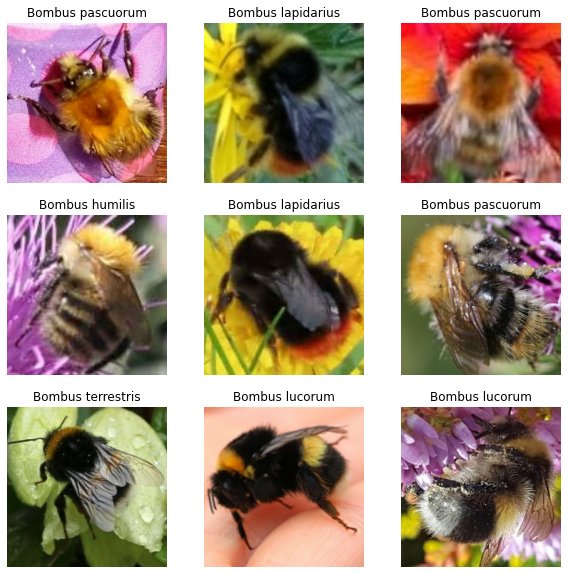

In [3]:
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis("off")

In [4]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
])

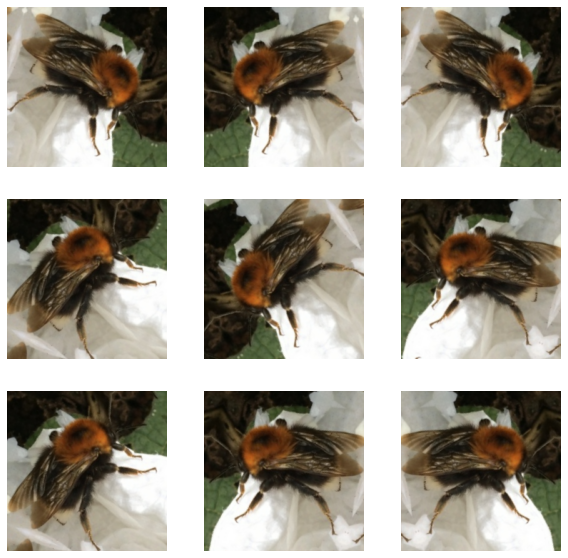

In [5]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

## Build the Model

In [6]:
preprocess_input = tf.keras.applications.resnet50.preprocess_input

# Create the base model from the pre-trained ResNew50 Model
base_model = tf.keras.applications.ResNet50(
    input_shape=IMG_SHAPE, include_top=False, weights='imagenet'
)
base_model.trainable = False

inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False) # Training=False will keep the batch normalization layers frozen when we fine-tune
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2, seed=SEED)(x)
outputs = tf.keras.layers.Dense(CLASS_NUM, activation='softmax')(x) # Coverts features into predictions
model = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top-3_accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top-5_accuracy')])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0     

## Train the Model


In [7]:
initial_epochs = 25

loss0, accuracy0, top30, top50 = model.evaluate(validation_dataset, verbose=0)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0*100))
print("initial top 3: {:.2f}".format(top30*100))
print("initial top 5: {:.2f}".format(top50*100))

checkpoint_path = 'D:/Jen/Documents/Dissertation/Checkpoints/UK_weights3-empty'
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=0)
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset, 
                    class_weight=class_weights, 
                    callbacks=[es_callback, cp_callback])

C:\Users\Jen\AppData\Local\Programs\Python\Python38\lib\site-packages\tensorflow\python\keras\backend.py:4947: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  warnings.warn(
initial loss: 4.26
initial accuracy: 1.93
initial top 3: 7.94
initial top 5: 15.21
Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Epoch 1/25
613/613 [==============================] - 1813s 3s/step - loss: 3.0161 - accuracy: 0.1362 - top-3_accuracy: 0.3200 - top-5_accuracy: 0.4571 - val_loss: 2.3466 - val_accuracy: 0.2946 - val_top-3_accuracy: 0.5550 - val_top-5_accuracy: 0.6974
Epoch 2/25
613/613 [==============================] - 1755s 3s/step - loss: 2.4590 - accuracy: 0.2843 - top-3_accuracy: 0.5343 - top-5_accuracy: 0.6755 - val_loss: 1.9583 - val_accuracy: 0.4240 - val

## Evaluate the Model

In [8]:
loss_ev, accuracy_ev, top3_ev, top5_ev = model.evaluate(test_dataset, verbose=0)
print('Test loss :', loss_ev)
print('Test accuracy :', accuracy_ev * 100)
print('Test top-3 accuracy :', top3_ev * 100)
print('Test top-5 accuracy :', top5_ev * 100)

Test loss : 1.29204261302948
Test accuracy : 60.925012826919556
Test top-3 accuracy : 84.34234857559204
Test top-5 accuracy : 90.98033308982849


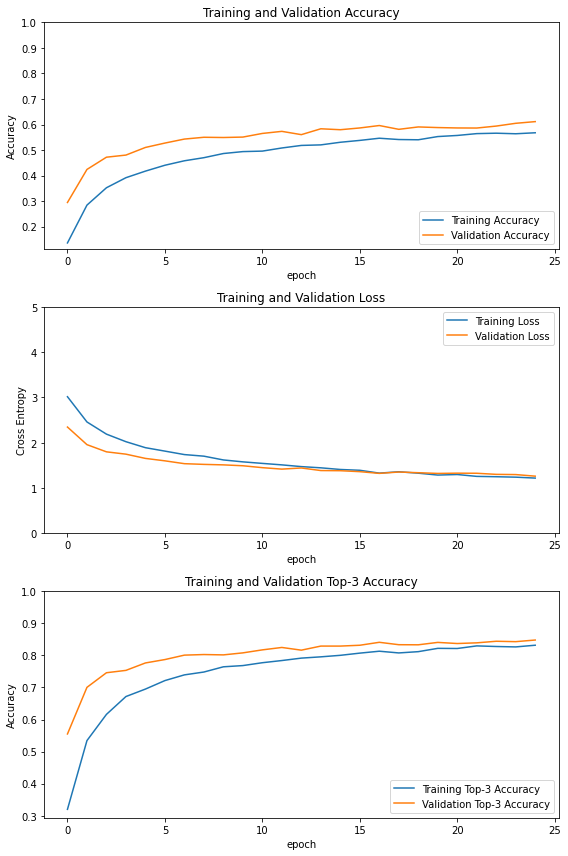

In [9]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

topk = history.history['top-3_accuracy']
val_topk = history.history['val_top-3_accuracy']

plt.figure(figsize=(8, 12))
plt.subplot(3, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.xlabel('epoch')
plt.title('Training and Validation Accuracy')

plt.subplot(3, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,5.0])
plt.xlabel('epoch')
plt.title('Training and Validation Loss')

#plt.figure(figsize=(8, 8))
plt.subplot(3, 1, 3)
plt.plot(topk, label='Training Top-3 Accuracy')
plt.plot(val_topk, label='Validation Top-3 Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.xlabel('epoch')
plt.title('Training and Validation Top-3 Accuracy')
plt.tight_layout()
plt.show()

Note: If you are wondering why the validation metrics are clearly better than the training metrics, the main factor is because layers like `tf.keras.layers.BatchNormalization` and `tf.keras.layers.Dropout` affect accuracy during training. They are turned off when calculating validation loss.

To a lesser extent, it is also because training metrics report the average for an epoch, while validation metrics are evaluated after the epoch, so validation metrics see a model that has trained slightly longer.

## Fine-Tuning of Model

In [10]:
base_model.trainable = True
print("Number of layers in the base model: ", len(base_model.layers))
# Fine-tune from this layer onwards
fine_tune_at = 81
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True), optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10), metrics=[tf.keras.metrics.CategoricalAccuracy(name='accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top-3_accuracy'), tf.keras.metrics.TopKCategoricalAccuracy(k=5, name='top-5_accuracy')])

model.summary()

Number of layers in the base model:  175
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)   

In [11]:
fine_tune_epochs = 15
total_epochs =  initial_epochs + fine_tune_epochs
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)
history_fine = model.fit(train_dataset,
                    epochs=total_epochs,
                    initial_epoch=history.epoch[-1],
                    validation_data=validation_dataset, 
                    class_weight=class_weights, 
                    callbacks=[es_callback, cp_callback])

Epoch 25/40
613/613 [==============================] - 3924s 6s/step - loss: 1.2056 - accuracy: 0.6038 - top-3_accuracy: 0.8494 - top-5_accuracy: 0.9241 - val_loss: 0.9674 - val_accuracy: 0.7066 - val_top-3_accuracy: 0.8968 - val_top-5_accuracy: 0.9473

Epoch 00025: saving model to D:/Jen/Documents/Dissertation/Checkpoints\UK_weights3-empty
Epoch 26/40
613/613 [==============================] - 3999s 7s/step - loss: 0.9797 - accuracy: 0.6685 - top-3_accuracy: 0.8924 - top-5_accuracy: 0.9449 - val_loss: 0.9484 - val_accuracy: 0.7090 - val_top-3_accuracy: 0.9010 - val_top-5_accuracy: 0.9480

Epoch 00026: saving model to D:/Jen/Documents/Dissertation/Checkpoints\UK_weights3-empty
Epoch 27/40
613/613 [==============================] - 3784s 6s/step - loss: 0.8632 - accuracy: 0.7026 - top-3_accuracy: 0.9073 - top-5_accuracy: 0.9543 - val_loss: 0.9109 - val_accuracy: 0.7139 - val_top-3_accuracy: 0.9115 - val_top-5_accuracy: 0.9520

Epoch 00027: saving model to D:/Jen/Documents/Dissertation/C

## Evaluate the Model

In [12]:
loss_ev, accuracy_ev, top3_ev, top5_ev = model.evaluate(test_dataset, verbose=0)
print('Test loss :', loss_ev)
print('Test accuracy :', accuracy_ev * 100)
print('Test top-3 accuracy :', top3_ev * 100)
print('Test top-5 accuracy :', top5_ev * 100)

Test loss : 0.8624648451805115
Test accuracy : 73.70927929878235
Test top-3 accuracy : 92.5015389919281
Test top-5 accuracy : 96.02028131484985


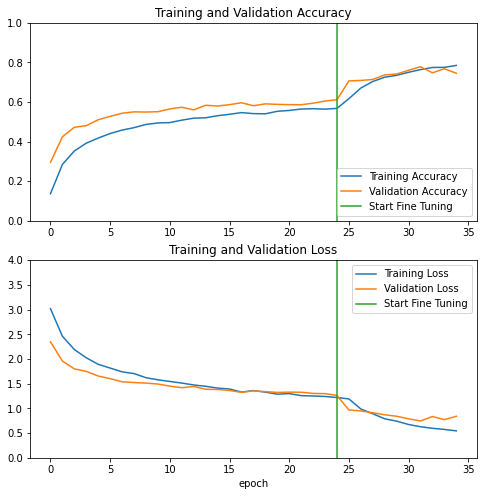

In [13]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 4.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

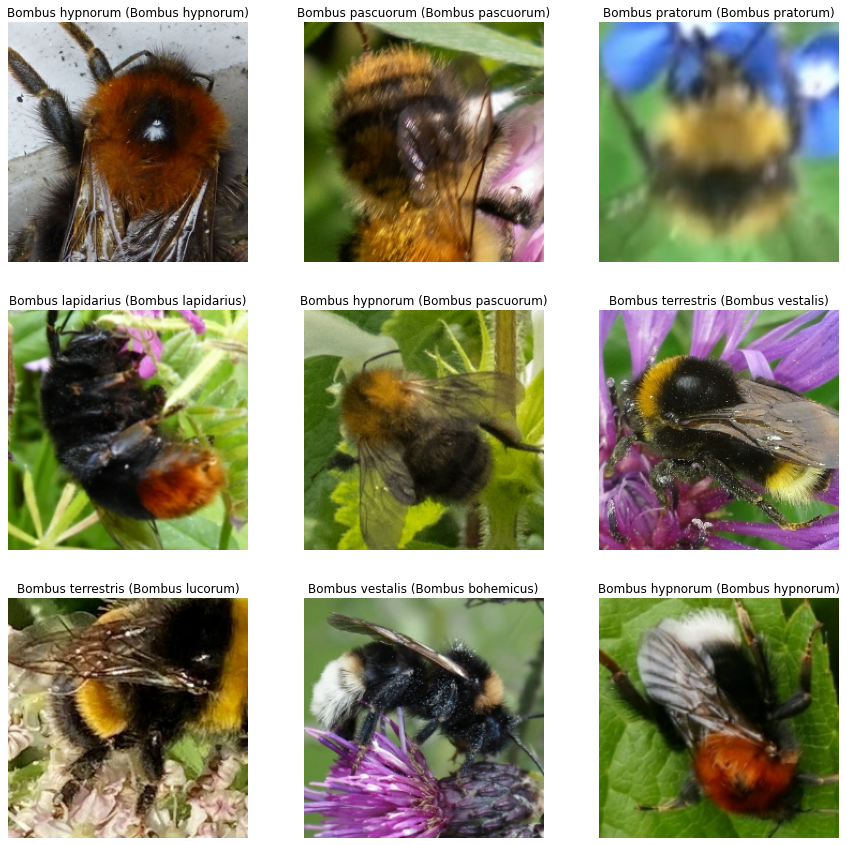

In [56]:
#Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

top_k = tf.math.top_k(
    predictions, k=3, sorted=True, name=None
)

predicted_indices = tf.argmax(predictions, 1)
predicted_class = tf.gather(class_names, predicted_indices)

plt.figure(figsize=(15, 15))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predicted_indices[i]] + " (" + class_names[label_batch[i]] + ")")
  plt.axis("off")

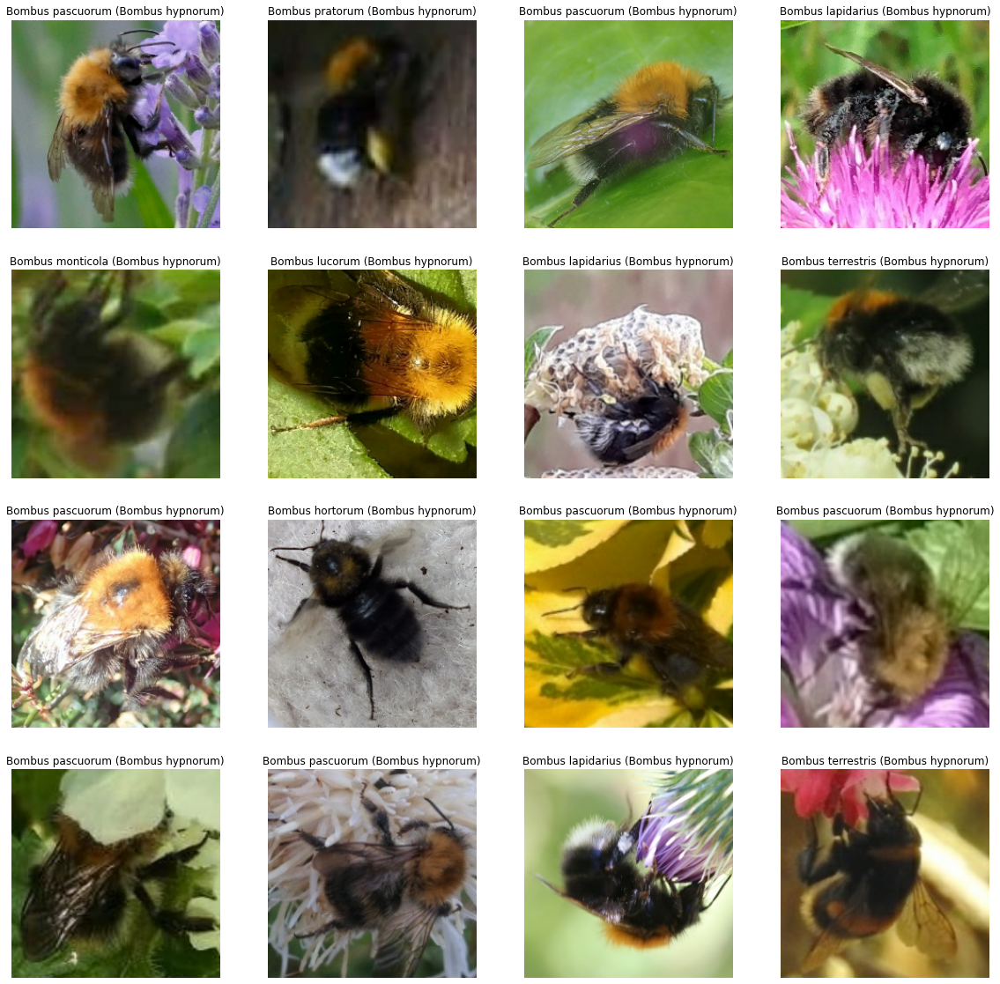

In [46]:
i = 0
plt.figure(figsize=(20, 20))
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    if i < 16:
        pred = model.predict(images)
        index_values = tf.argmax(pred, 1)
        label_values = tf.argmax(labels, 1) 
        for j in range(len(labels)):
            if i < 16 and index_values[j] != 5 and label_values[j] == 5:
                ax = plt.subplot(4, 4, i + 1)
                plt.imshow(images[j].numpy().astype("uint8"))
                plt.title(class_names[index_values[j]] + " (" + class_names[label_values[j]] + ")")
                plt.axis("off")
                i += 1

### Confusion Matricies

In [10]:
def calculate_and_display_CM(dataset, model, class_names, class_num):
    cm = np.zeros([class_num, class_num])
    for images, labels in dataset.take(tf.data.experimental.cardinality(dataset)):
        pred = tf.argmax(model.predict(images), 1)
        y_data = tf.argmax(labels, 1)
        for p,x in zip(pred, y_data):
            cm[x,p]+=1.0
    cm = cm.astype('float')
    cm_sum = cm.sum(axis=1)[:, np.newaxis]
    cm = np.divide(cm, cm_sum, out=np.zeros_like(cm), where=cm_sum!=0)
    display_CM(cm, class_names)

def display_CM(cm, class_names):
    figure = plt.figure(figsize=(16, 16))
    sns.heatmap(cm, annot=True,cmap=plt.cm.Blues, xticklabels=class_names, yticklabels=class_names)
    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predictied Label')
    plt.show()

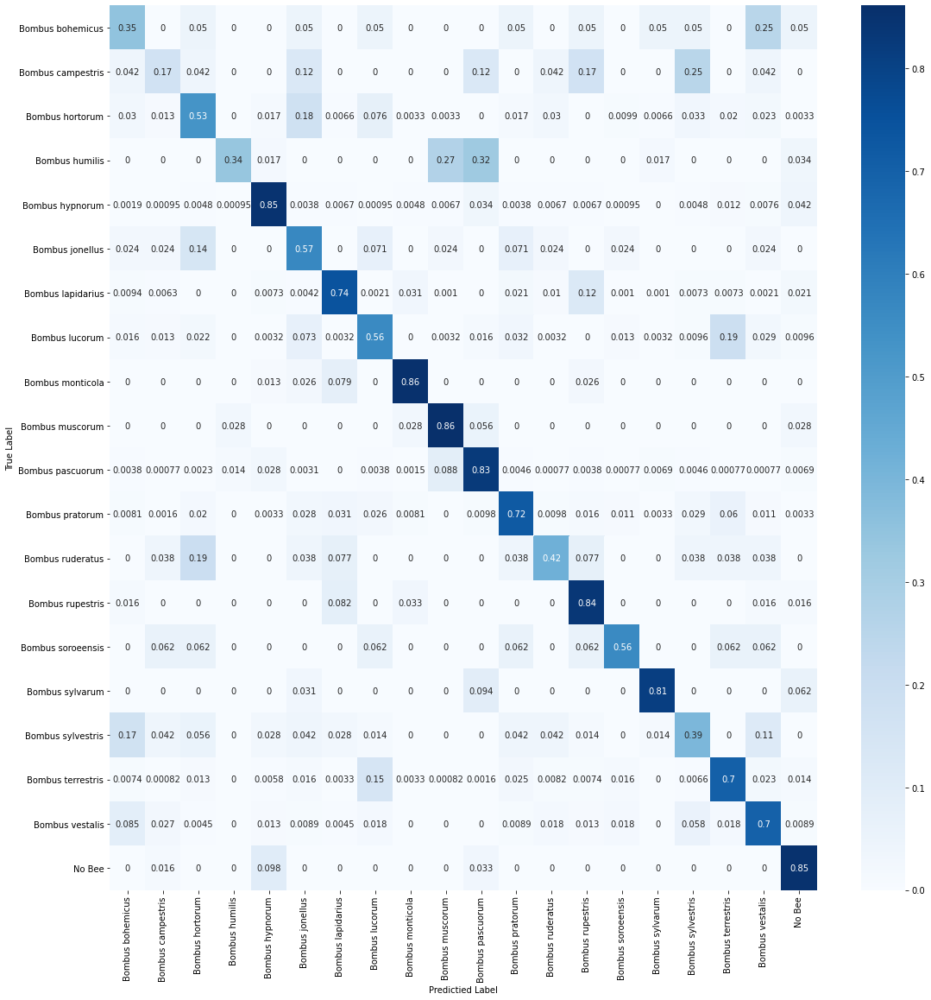

In [21]:
calculate_and_display_CM(test_dataset, model, class_names, CLASS_NUM)

## Probability Matrix

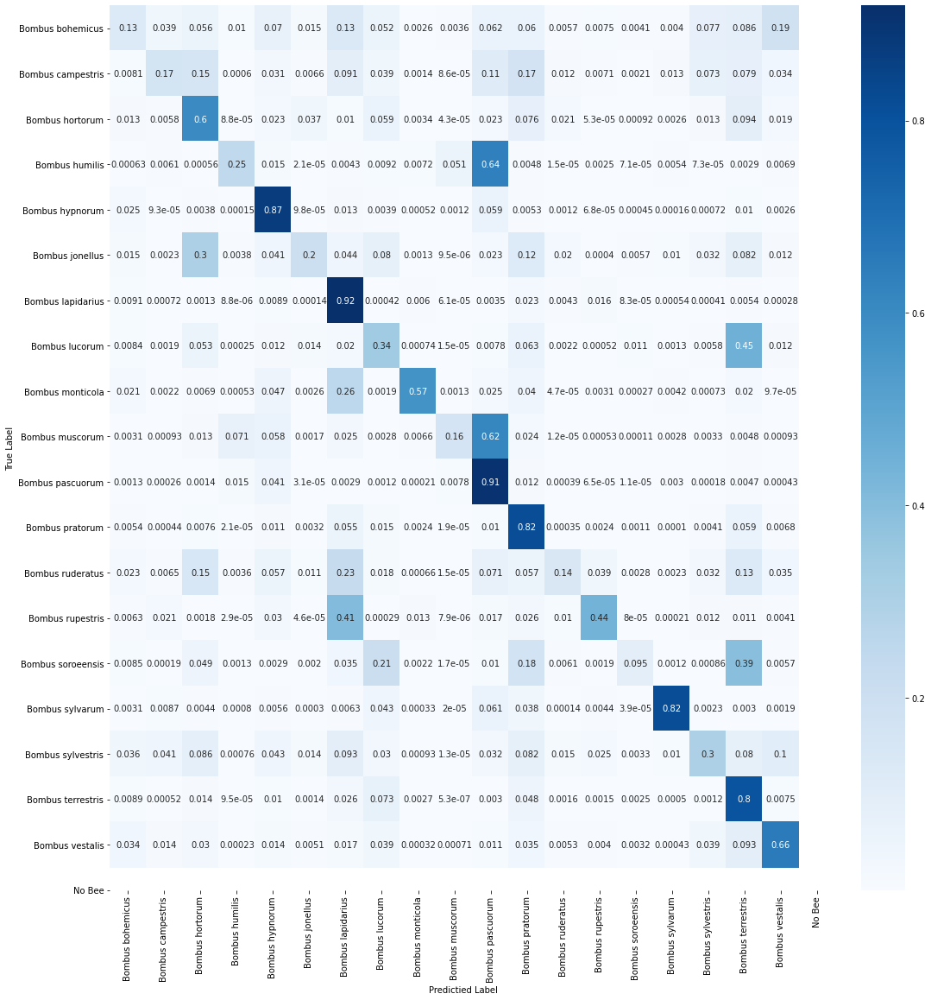

In [8]:
cm_prob = np.zeros([CLASS_NUM,CLASS_NUM])
for images, labels in validation_dataset.take(tf.data.experimental.cardinality(validation_dataset)):
    pred = model.predict(images)
    index_values = tf.argmax(pred, 1)
    index_labels = tf.argmax(labels, 1)
    for x,a in zip(pred,index_labels):
        cm_prob[:,a]+=x
cm_prob_norm = cm_prob.astype('float') / cm_prob.sum(axis=1)[:, np.newaxis]
display_CM(cm_prob_norm, class_names)


### Save the Model

In [ ]:
model.save('D:/Jen/Documents/Dissertation/Models/UK_weights3_empty')

In [6]:
model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights3')

In [16]:
LOG_PROBABILITY = True
NO_BEE_CLASS = False
CM_PROB = False
file_name = 'cnn_log.txt'

for i in range(1, 83):
    result_dir = 'D:/Jen/Documents/Dissertation/Video_Results/VID (' + str(i) + ')/'
    if not os.path.exists(result_dir):
        print("[INFO] making folder:", result_dir)
        os.makedirs(result_dir)
    
    folder_path = 'D:/Jen/Documents/Dissertation/Video_Cropped/VID (' + str(i) + ')/Bombus/'
    if len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]) == 0:
        continue
    f = open(result_dir + file_name, "w")

    video_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Video_Cropped\VID (' + str(i) + ')',
                                                shuffle=False,
                                                seed=SEED,
                                                batch_size=BATCH_SIZE,
                                                image_size=IMG_SIZE)
    video_pred = model.predict(video_dataset)
    if CM_PROB:
        newprobs = np.zeros_like(video_pred)
        pred_index = np.argmax(video_pred,1)
        for i,p in enumerate(pred_index):
            newprobs[i,:] = cm_prob_norm[p,:]
        video_pred = newprobs
        

    if LOG_PROBABILITY:
        video_pred = np.log(video_pred)
    vid_index_values = tf.argmax(video_pred, 1)
    confidences = [0 for i in range(CLASS_NUM)]
    num_bee_frames = 0
    for i in range(len(vid_index_values)):
        if LOG_PROBABILITY:
            frame_prob = np.exp(np.max(video_pred[i]))
        else: 
            frame_prob = np.max(video_pred[i])
        f.write("Prediction: {}, with {:.2f} percent confidence. \n"
        .format(class_names[vid_index_values[i]], 100 * frame_prob))
        if NO_BEE_CLASS != True or class_names[vid_index_values[i]] != 'No Bee':
            confidences = np.add(video_pred[i], confidences)
            num_bee_frames += 1
    #print(confidences)
    if sum(confidences) == 0:
        f.write("No bee found")
    else:
        final_index = np.argmax(confidences)
        if LOG_PROBABILITY:
            final_prob = np.exp(confidences[final_index] / num_bee_frames)
        else:
            final_prob = confidences[final_index] / num_bee_frames
        f.write("Prediction: {}, with {:.2f} percent average confidence.".format(class_names[final_index], (100 * final_prob)))
        f.close()

Found 6 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 25 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 1 files belonging to 1 classes.
Found 34 files belonging to 1 classes.
Found 109 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 63 files belonging to 1 classes.
Found 128 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 3 files belonging to 1 classes.
Found 2 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 38 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 49 files belonging to 1 classes.
Found 27 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 37 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 4 files belonging to 1 classe

## Gaussian Process & SVM Classification

In [ ]:
model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights3')

### Feature vector of length of the number of classes.

In [17]:
base_learning_rate = 0.0001
model.layers[6].activation=None
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True), optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate/10), metrics=[tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.TopKCategoricalAccuracy(k=3)])

### Feature vector of length 2048 (output of global average pooling)

In [ ]:
model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(index=5).output)

### Extract features from the dataset
This may take a while to run

In [18]:
x_val = 0
y_val = 0
first_run = True
for images, labels in validation_dataset.take(tf.data.experimental.cardinality(validation_dataset)):
    extrac = model.predict(images)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x_val = extrac
        y_val = index_labels
        first_run = False
    else:
        x_val = np.concatenate((x_val, extrac), axis=0)
        y_val = np.concatenate([y_val, index_labels])

x_test = 0
y_test = 0
first_run = True
for images, labels in test_dataset.take(tf.data.experimental.cardinality(test_dataset)):
    extrac = model.predict(images)
    index_labels = tf.argmax(labels, 1)
    if first_run:
        x_test = extrac
        y_test = index_labels
        first_run = False
    else:
        x_test = np.concatenate((x_test, extrac), axis=0)
        y_test = np.concatenate([y_test, index_labels])

### Save feature outputs

In [20]:
output_file = "D:/Jen/Documents/Dissertation/Outputs/UK_weights3/UK_weights3"
x_val.tofile(output_file + "_X_validation.np")
y_val.tofile(output_file + "_Y_validation.np")
x_test.tofile(output_file + "_X_test.np")
y_test.tofile(output_file + "_Y_test.np")

### Data resampling

In [22]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler 
from imblearn.under_sampling import RandomUnderSampler 

print('Original dataset shape %s' % Counter(y_val))


sm = RandomOverSampler(random_state=1234)

x_res, y_res = sm.fit_resample(x_val, y_val)

print('Oversampled dataset shape %s' % Counter(y_res))
print(x_res.shape)
print(y_res.shape)

us = RandomUnderSampler(random_state=1234, sampling_strategy={0:250, 1:250, 2:250, 3:250, 4:250, 5:250, 6:250, 7:250, 8:250, 9:250, 10:250, 11:250, 12:250, 13:250, 14:250, 15:250, 16:250, 17:250, 18:250})

x_res, y_res = us.fit_resample(x_res, y_res)

print('Resampled dataset shape %s' % Counter(y_res))
print(x_res.shape)
print(y_res.shape)

Original dataset shape Counter({10: 1300, 17: 1215, 4: 1051, 6: 961, 11: 619, 7: 317, 2: 304, 18: 232, 0: 80, 8: 76, 16: 71, 13: 62, 3: 56, 5: 41, 9: 39, 15: 34, 12: 26, 1: 23, 14: 16})
Oversampled dataset shape Counter({11: 1300, 7: 1300, 10: 1300, 4: 1300, 17: 1300, 6: 1300, 18: 1300, 15: 1300, 2: 1300, 3: 1300, 0: 1300, 1: 1300, 8: 1300, 9: 1300, 13: 1300, 5: 1300, 16: 1300, 14: 1300, 12: 1300})
(24700, 19)
(24700,)
Resampled dataset shape Counter({0: 250, 1: 250, 2: 250, 3: 250, 4: 250, 5: 250, 6: 250, 7: 250, 8: 250, 9: 250, 10: 250, 11: 250, 12: 250, 13: 250, 14: 250, 15: 250, 16: 250, 17: 250, 18: 250})
(4750, 19)
(4750,)


### Gaussian Process Classification

GP accuracy: 68.93%

GP Top-3 Accuracy: 72.76%

GP Top-5 Accuracy: 74.19%

GP loss: 2.34



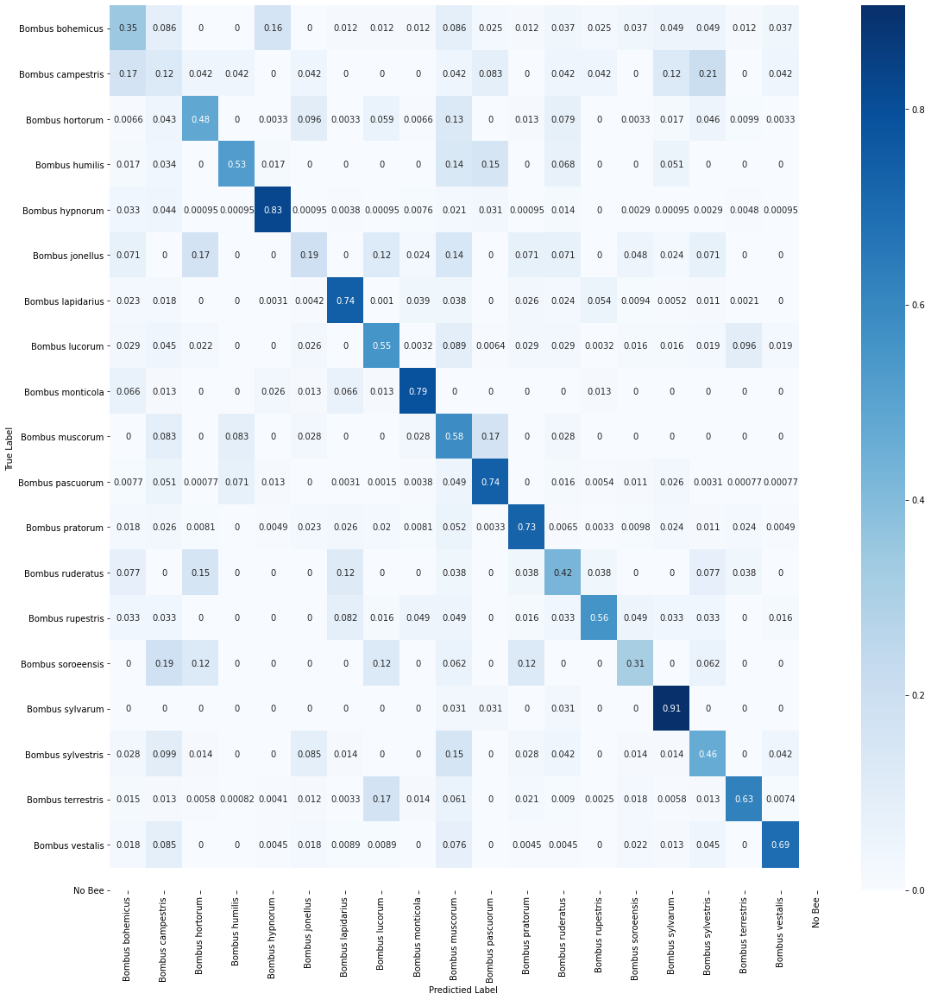

In [28]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn import decomposition

kernel = 1.0 * RBF(3.0)
gpc = make_pipeline(StandardScaler(), GaussianProcessClassifier(kernel=kernel, random_state=1234, n_restarts_optimizer=0))
gpc.fit(x_res, y_res)
gp_pred = gpc.predict(x_test)
gp_accuracy = metrics.accuracy_score(y_test, gp_pred)
gp_pred_proba = gpc.predict_proba(x_test)
print('GP accuracy: {:.2%}\n'.format(gp_accuracy))
print('GP Top-3 Accuracy: {:.2%}\n'.format(metrics.top_k_accuracy_score(y_test, gp_pred_proba, k=3)))
print('GP Top-5 Accuracy: {:.2%}\n'.format(metrics.top_k_accuracy_score(y_test, gp_pred_proba, k=5)))
print('GP loss: {:.3}\n'.format(metrics.log_loss(y_test, gp_pred_proba)))

cm_gp = confusion_matrix(y_test, gp_pred, normalize='true')
display_CM(cm_gp, class_names)

In [30]:
import joblib
joblib.dump(gpc, 'D:\Jen\Documents\Dissertation\Models\GaussianProcess\weights3.joblib')

['D:\\Jen\\Documents\\Dissertation\\Models\\GaussianProcess\\weights3.joblib']

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import seaborn as sns
from tensorflow.keras.preprocessing import image_dataset_from_directory

LOG_PROBABILITY = False
NO_BEE_CLASS = False
CM_PROB = False
file_name = 'cnn_GP.txt'

for i in range(1, 83):
    result_dir = 'D:/Jen/Documents/Dissertation/Video_Results/VID (' + str(i) + ')/'
    if not os.path.exists(result_dir):
        print("[INFO] making folder:", result_dir)
        os.makedirs(result_dir)
    
    folder_path = 'D:/Jen/Documents/Dissertation/Video_Cropped/VID (' + str(i) + ')/Bombus/'
    if len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]) == 0:
        continue
    f = open(result_dir + file_name, "w")

    video_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Video_Cropped\VID (' + str(i) + ')',
                                                shuffle=False,
                                                seed=SEED,
                                                batch_size=BATCH_SIZE,
                                                image_size=IMG_SIZE)
    x_vid = model.predict(video_dataset)
    if LOG_PROBABILITY:
        video_pred = gpc.predict_proba(x_vid)
        video_pred = np.log(video_pred)
    else:
        video_pred = gpc.predict_proba(x_vid)
    if CM_PROB:
        newprobs = np.zeros_like(video_pred)
        pred_index = np.argmax(video_pred,1)
        for i,p in enumerate(pred_index):
            newprobs[i,:] = cm_prob_norm[p,:]
        video_pred = newprobs
    vid_index_values = tf.argmax(video_pred, 1)
    confidences = [0 for i in range(CLASS_NUM)]
    num_bee_frames = 0
    for i in range(len(vid_index_values)):
        if LOG_PROBABILITY:
            frame_prob = np.exp(np.max(video_pred[i]))
        else: 
            frame_prob = np.max(video_pred[i])
        f.write("Prediction: {}, with {:.2f} percent confidence. \n"
        .format(class_names[vid_index_values[i]], 100 * frame_prob))
        if NO_BEE_CLASS != True or class_names[vid_index_values[i]] != 'No Bee':
            confidences = np.add(video_pred[i], confidences)
            num_bee_frames += 1
    #print(confidences)
    final_index = np.argmax(confidences)
    if sum(confidences) == 0:
        f.write("No bee found")
    else:
        final_index = np.argmax(confidences)
        if LOG_PROBABILITY:
            final_prob = np.exp(confidences[final_index] / num_bee_frames)
        else:
            final_prob = confidences[final_index] / num_bee_frames
        f.write("Prediction: {}, with {:.2f} percent average confidence.".format(class_names[final_index], (100 * final_prob)))
    f.close()

Found 6 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 25 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 1 files belonging to 1 classes.
Found 34 files belonging to 1 classes.
Found 109 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 63 files belonging to 1 classes.
Found 128 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 3 files belonging to 1 classes.
Found 2 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 38 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 49 files belonging to 1 classes.
Found 27 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 37 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 4 files belonging to 1 classe

### SVM Classification

SVM Accuracy: 75.69%

SVM Top-3 Accuracy: 89.61%

SVM Top-5 Accuracy: 93.65%

SVM loss: 1.01



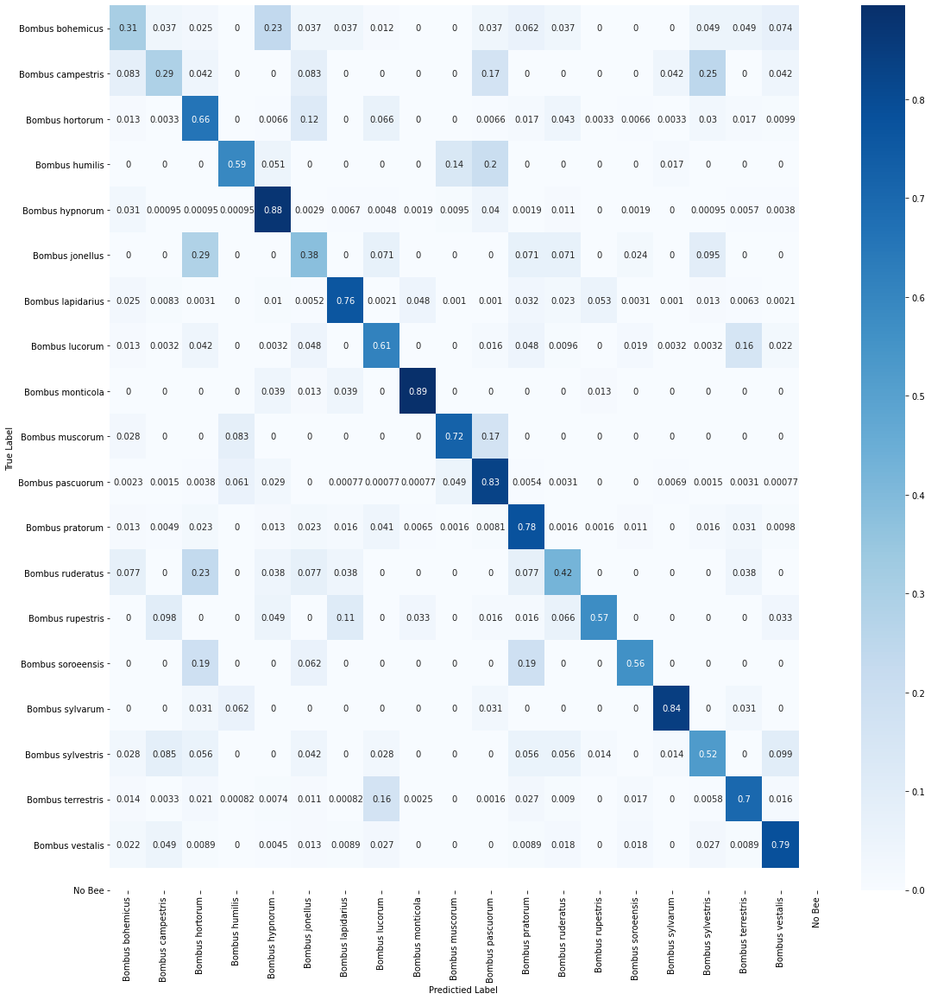

In [24]:
from sklearn import svm
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

svm = make_pipeline(StandardScaler(), svm.SVC(kernel='linear', C=1, decision_function_shape='ovo', probability=True))

svm.fit(x_res, y_res)
svm_pred = svm.predict(x_test)
svm_pred_proba = svm.predict_proba(x_test)
print('SVM Accuracy: {:.2%}\n'.format(metrics.accuracy_score(y_test, svm_pred)))
print('SVM Top-3 Accuracy: {:.2%}\n'.format(metrics.top_k_accuracy_score(y_test, svm_pred_proba, k=3)))
print('SVM Top-5 Accuracy: {:.2%}\n'.format(metrics.top_k_accuracy_score(y_test, svm_pred_proba, k=5)))
print('SVM loss: {:.3}\n'.format(metrics.log_loss(y_test, svm_pred_proba)))

cm_svm = confusion_matrix(y_test, svm_pred, normalize='true')
display_CM(cm_svm, class_names)

In [25]:
import joblib
joblib.dump(svm, 'D:\Jen\Documents\Dissertation\Models\SupportVectorMachine\weights3.joblib')

['D:\\Jen\\Documents\\Dissertation\\Models\\SupportVectorMachine\\weights3.joblib']

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
import seaborn as sns
from tensorflow.keras.preprocessing import image_dataset_from_directory

NO_BEE_CLASS = False
LOG_PROBABILITY = False
file_name = 'cnn_svm.txt'

for i in range(1, 83):
    result_dir = 'D:/Jen/Documents/Dissertation/Video_Results/VID (' + str(i) + ')/'
    if not os.path.exists(result_dir):
        print("[INFO] making folder:", result_dir)
        os.makedirs(result_dir)
    
    folder_path = 'D:/Jen/Documents/Dissertation/Video_Cropped/VID (' + str(i) + ')/Bombus/'
    if len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]) == 0:
        continue
    f = open(result_dir + file_name, "w")

    video_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Video_Cropped\VID (' + str(i) + ')',
                                                shuffle=False,
                                                seed=SEED,
                                                batch_size=BATCH_SIZE,
                                                image_size=IMG_SIZE)

    x_vid = model.predict(video_dataset)
    if LOG_PROBABILITY:
        video_pred = svm.predict_log_proba(x_vid)
    else:
        video_pred = svm.predict_proba(x_vid)
    vid_index_values = tf.argmax(video_pred, 1)
    confidences = [0 for i in range(CLASS_NUM)]
    num_bee_frames = 0
    for i in range(len(vid_index_values)):
        if LOG_PROBABILITY:
            frame_prob = np.exp(np.max(video_pred[i]))
        else: 
            frame_prob = np.max(video_pred[i])
        f.write("Prediction: {}, with {:.2f} percent confidence. \n"
        .format(class_names[vid_index_values[i]], 100 * frame_prob))
        if NO_BEE_CLASS != True or class_names[vid_index_values[i]] != 'No Bee':
            confidences = np.add(video_pred[i], confidences)
            num_bee_frames += 1
    #print(confidences)
    final_index = np.argmax(confidences)
    if sum(confidences) == 0:
        f.write("No bee found")
    else:
        final_index = np.argmax(confidences)
        if LOG_PROBABILITY:
            final_prob = np.exp(confidences[final_index] / num_bee_frames)
        else:
            final_prob = confidences[final_index] / num_bee_frames
        f.write("Prediction: {}, with {:.2f} percent average confidence.".format(class_names[final_index], (100 * final_prob)))
    f.close()

Found 6 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 25 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 1 files belonging to 1 classes.
Found 34 files belonging to 1 classes.
Found 109 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 63 files belonging to 1 classes.
Found 128 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 3 files belonging to 1 classes.
Found 2 files belonging to 1 classes.
Found 4 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 38 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 49 files belonging to 1 classes.
Found 27 files belonging to 1 classes.
Found 18 files belonging to 1 classes.
Found 5 files belonging to 1 classes.
Found 6 files belonging to 1 classes.
Found 37 files belonging to 1 classes.
Found 31 files belonging to 1 classes.
Found 4 files belonging to 1 classe

## Covered/Uncovered Accuracy Comparison
This is to test if the bees are only being identified by the flowers in the image

In [5]:
model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights3')

Found 179 files belonging to 19 classes.
Found 179 files belonging to 19 classes.
Uncovered accuracy : 86.03%
Covered accuracy : 3.91%


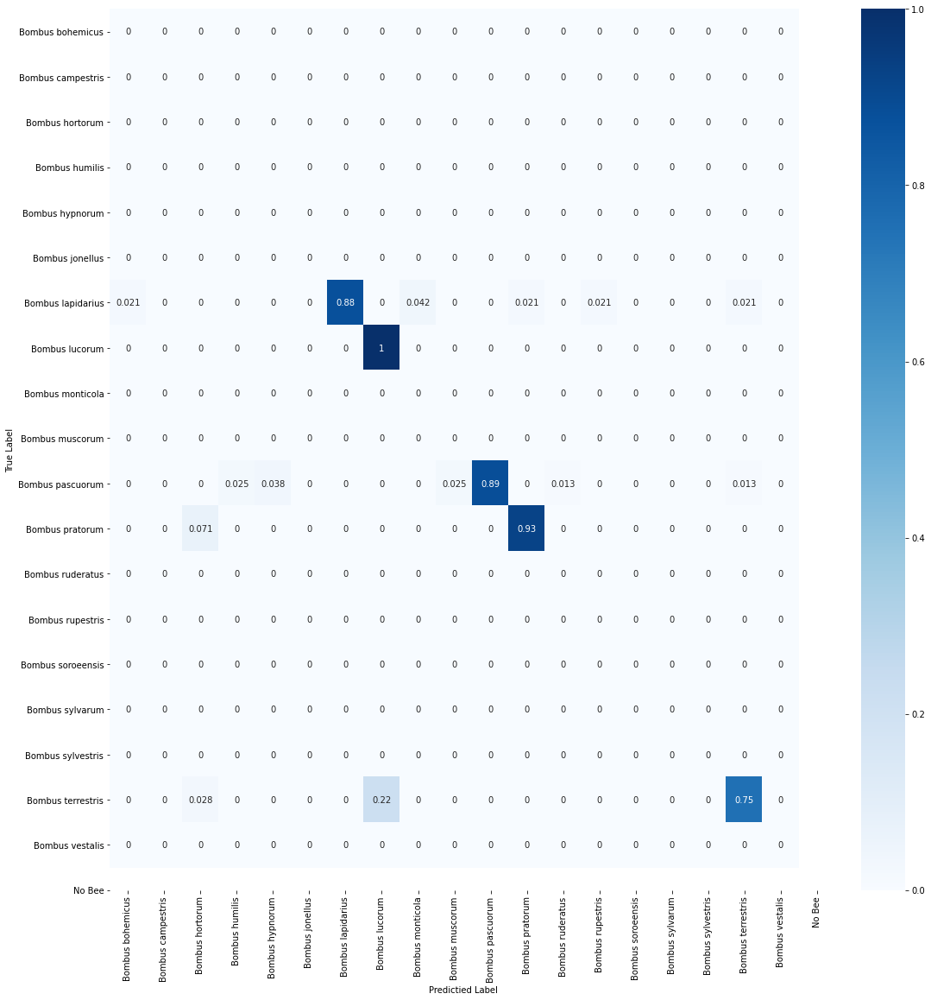

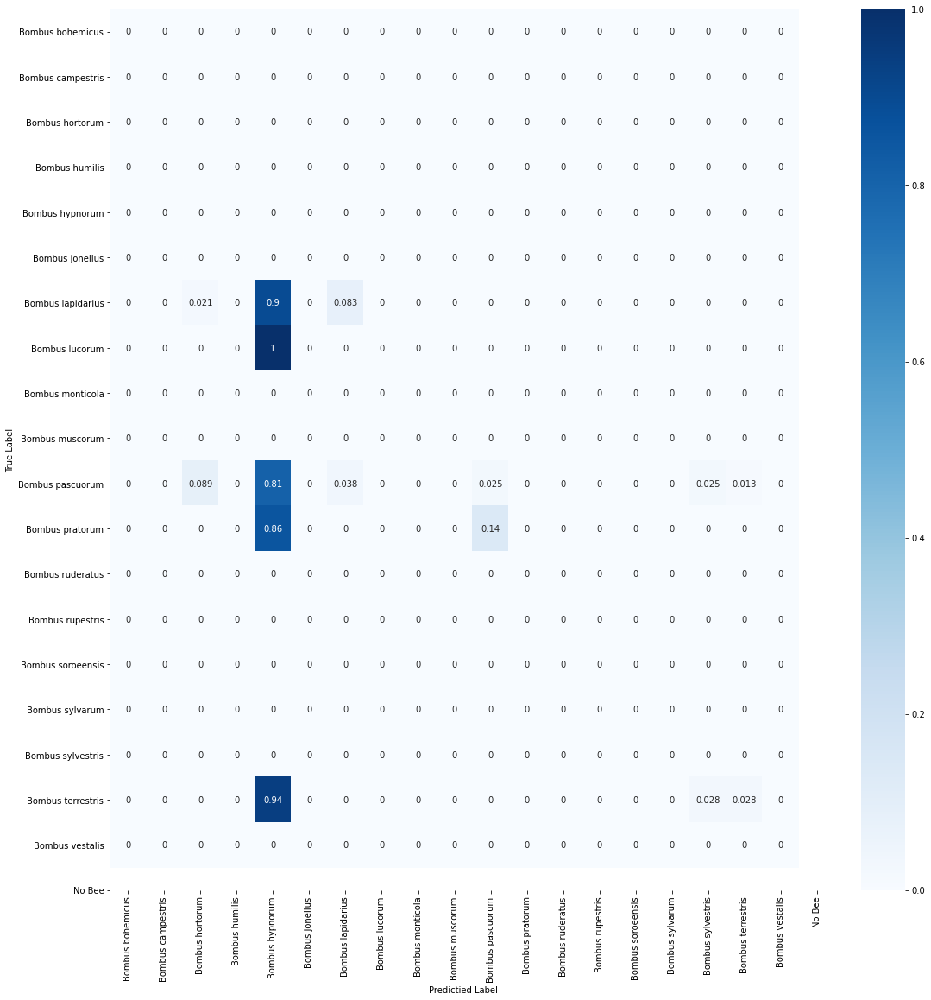

In [11]:
cropped_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Bee_Data_cc0\Cropped',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
covered_dataset = image_dataset_from_directory('D:\Jen\Documents\Dissertation\Bee_Data_cc0\Covered',
                                             shuffle=True,
                                             seed=SEED,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
cropped_dataset = cropped_dataset.map(one_hot_map)
covered_dataset = covered_dataset.map(one_hot_map)

cropped_accuracy = model.evaluate(cropped_dataset, verbose=0)
print('Uncovered accuracy : {:.2%}'.format(cropped_accuracy[1]))
covered_accuracy = model.evaluate(covered_dataset, verbose=0)
print('Covered accuracy : {:.2%}'.format(covered_accuracy[1]))
calculate_and_display_CM(cropped_dataset, model, class_names, CLASS_NUM)
calculate_and_display_CM(covered_dataset, model, class_names, CLASS_NUM)

## Resnet50 Model Summary

In [37]:
base_model = tf.keras.applications.ResNet50(
    input_shape=IMG_SHAPE, include_top=False, weights='imagenet'
)
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

## Visualisation of CNN Outputs

In [ ]:
model = tf.keras.models.load_model('D:/Jen/Documents/Dissertation/Models/UK_weights3_empty')

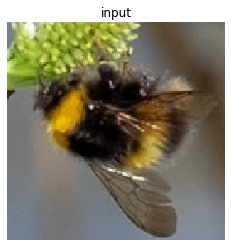

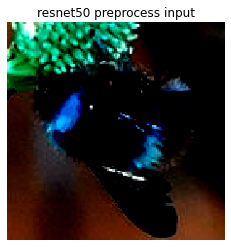

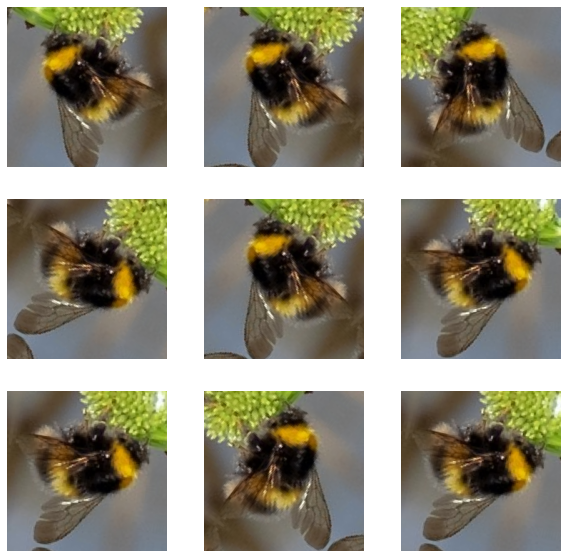

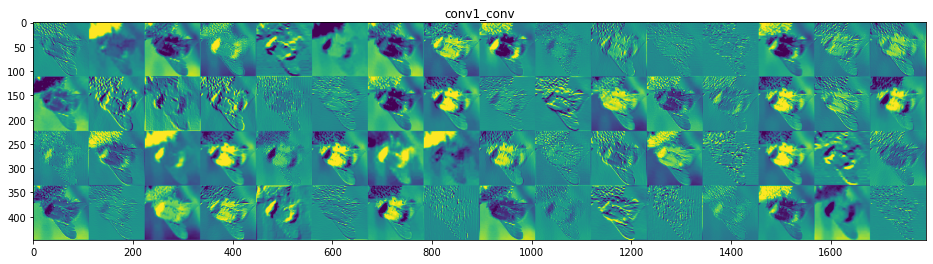

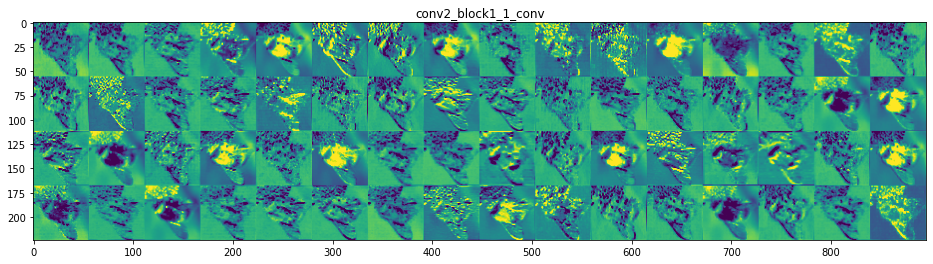

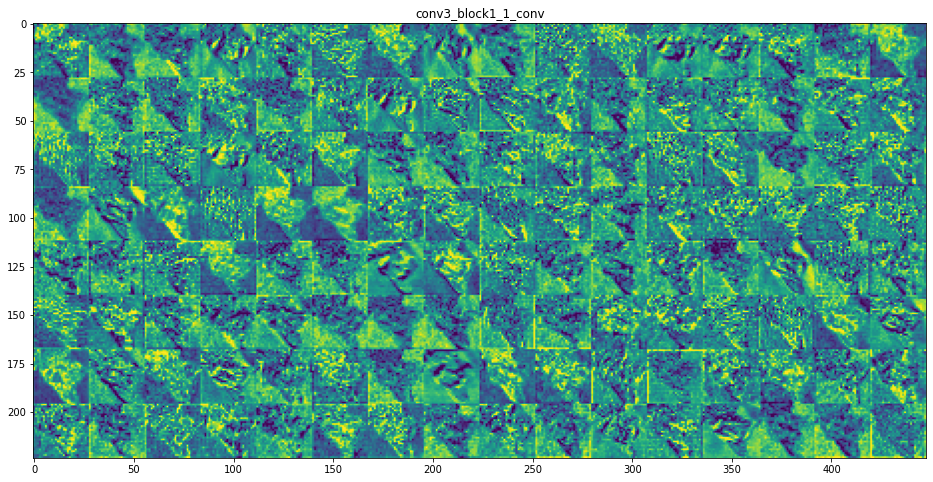

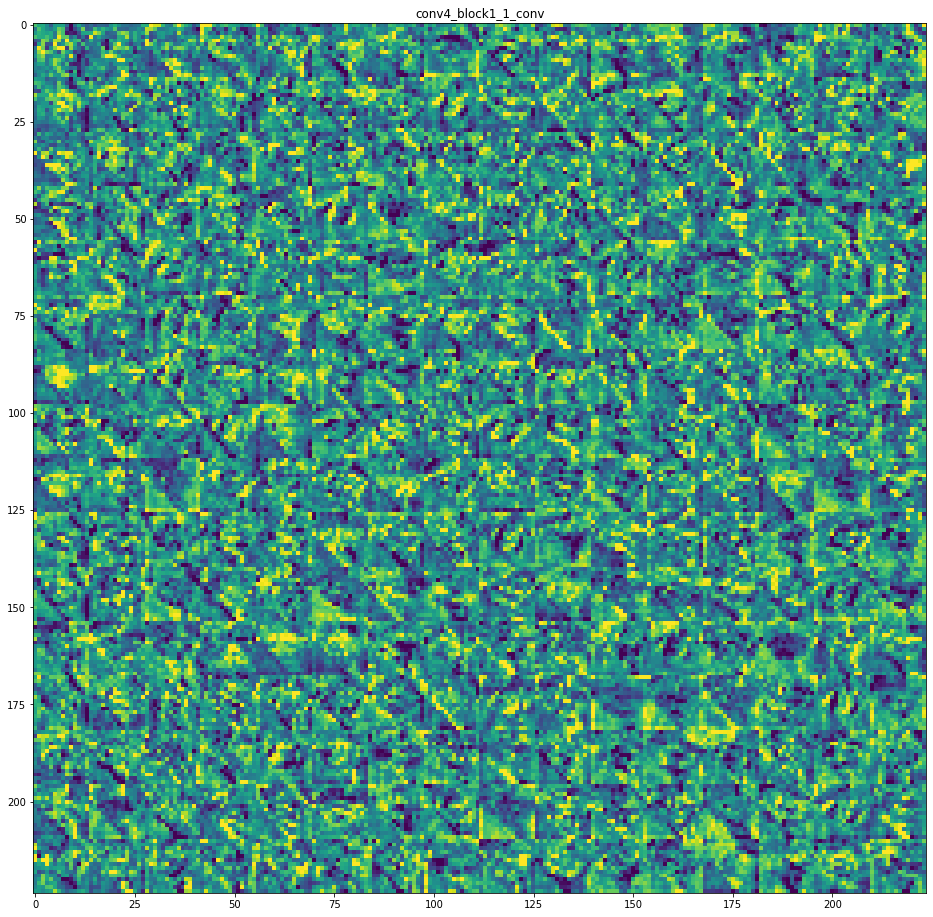

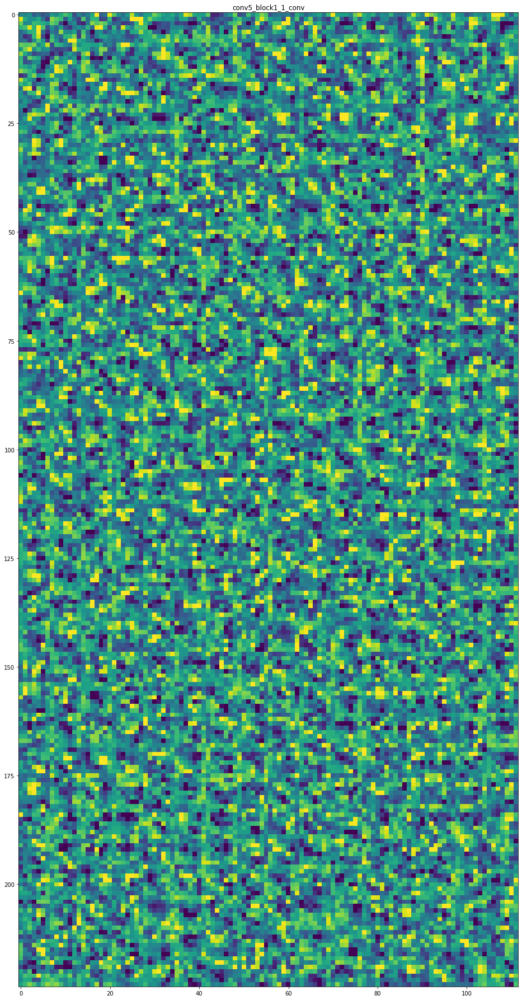

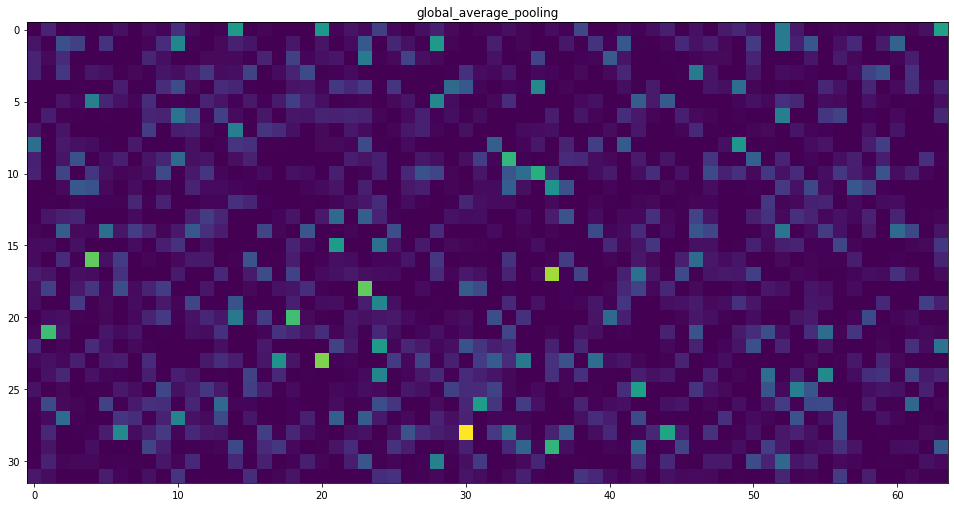

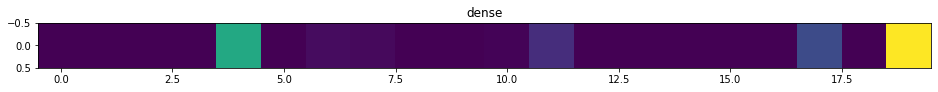

In [115]:
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

#Bee_Data_UK/Weights3/Test/Bombus pascuorum/bee157.jpg_CROPPED.jpg
#Bees_Covered/Bombus terrestris/bee415_COVERED.jpg
#vintage-brick-red-wall.jpg
img_path = 'D:/Jen/Documents/Dissertation/Bee_Data_iNaturalist_UK_cc0/example_bee2.jpg'
img = image.load_img(img_path, target_size=(IMG_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_input = img_tensor / 255.
img_tensor = tf.keras.applications.resnet.preprocess_input(img_tensor)
img_processed = img_tensor / 100.

plt.title('input')
plt.imshow(img_input[0])
plt.axis('off')
plt.show()

plt.title('resnet50 preprocess input')
plt.imshow(img_processed[0])
plt.axis('off')
plt.show()

plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(img_input[0], 0))
    plt.imshow(augmented_image[0])
    plt.axis('off')

layer_names = ['conv1_conv', 'conv2_block1_1_conv', 'conv3_block1_1_conv', 'conv4_block1_1_conv', 'conv5_block1_1_conv']#[x.name for x in base_model.layers]
activations = []
for layer_name in layer_names:
    intermediate_layer_model = Model(inputs=base_model.input,
                                 outputs=base_model.get_layer(layer_name).output)
    intermediate_output = intermediate_layer_model.predict(img_tensor)
    activations.append(intermediate_output)
   
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps layer_names, activations
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()
gap_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(index=5).output)
gap = np.reshape(gap_model.predict(img_tensor), (-1, 64))
plt.figure(figsize=(16.5, 16))
plt.title('global_average_pooling')
plt.imshow(gap, cmap='viridis')
plt.show()

final = model.predict(img_tensor)
plt.figure(figsize=(16, 16))
plt.title('dense')
plt.imshow(final, cmap='viridis')
plt.show()

In [80]:
print(np.argmax(final))

4


## Unit Tests

In [12]:
import unittest
from unittest.mock import patch

CLASS_NUM = 5

class TestOneHotMap(unittest.TestCase):
    def setUp(self):
        self.image = "Does not need to be an image, just needs to test that the image variable is unchanged."
    
    def testOneHotMapMiddle(self):
        label = 3
        self.assertEqual(one_hot_map(self.image, label)[0], self.image)
        tf.debugging.assert_equal(one_hot_map(self.image, label)[1], tf.convert_to_tensor([0., 0., 0., 1.0, 0.]))
    
    def testOneHotMapStart(self):
        label = 0
        self.assertEqual(one_hot_map(self.image, label)[0], self.image)
        tf.debugging.assert_equal(one_hot_map(self.image, label)[1], tf.convert_to_tensor([1.0, 0., 0., 0., 0.]))

    def testOneHotMapEnd(self):
        label = 4
        self.assertEqual(one_hot_map(self.image, label)[0], self.image)
        tf.debugging.assert_equal(one_hot_map(self.image, label)[1], tf.convert_to_tensor([0., 0., 0., 0., 1.0]))

    def testOneHotMapBeyond(self):
        label = 5
        self.assertEqual(one_hot_map(self.image, label)[0], self.image)
        tf.debugging.assert_equal(one_hot_map(self.image, label)[1], tf.convert_to_tensor([0., 0., 0., 0., 0.]))

    def testOneHotMapping(self):
        images = ["image1", "image2", "image3", "image4", "image5"]
        result = list(map(lambda img, label: one_hot_map(img, label), images, [0, 1, 2, 3, 4]))
        self.assertEqual(result[0][0], "image1")
        self.assertEqual(result[1][0], "image2")
        self.assertEqual(result[2][0], "image3")
        self.assertEqual(result[3][0], "image4")
        self.assertEqual(result[4][0], "image5")
        tf.debugging.assert_equal(result[0][1], tf.convert_to_tensor([1.0, 0., 0., 0., 0.]))
        tf.debugging.assert_equal(result[1][1], tf.convert_to_tensor([0., 1.0, 0., 0., 0.]))
        tf.debugging.assert_equal(result[2][1], tf.convert_to_tensor([0., 0., 1.0, 0., 0.]))
        tf.debugging.assert_equal(result[3][1], tf.convert_to_tensor([0., 0., 0., 1.0, 0.]))
        tf.debugging.assert_equal(result[4][1], tf.convert_to_tensor([0., 0., 0., 0., 1.0]))

class TestGetClassWeights(unittest.TestCase):
    def setUp(self):
        BATCH_SIZE = 32
        IMG_SIZE = (224, 224)
        self.dataset = image_dataset_from_directory('Test_Dataset',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE)
    
    def testGetClassWeights(self):
        weights = get_class_weights(self.dataset)
        self.assertDictEqual(weights, {0: 0.7458333333333333, 1:17.9, 2: 0.4531645569620253, 3: 2.557142857142857, 4: 0.9944444444444445})

unittest.main(argv=[''], verbosity=2, exit=False)

testGetClassWeights (__main__.TestGetClassWeights) ... Found 179 files belonging to 19 classes.
ok
testOneHotMapBeyond (__main__.TestOneHotMap) ... ok
testOneHotMapEnd (__main__.TestOneHotMap) ... ok
testOneHotMapMiddle (__main__.TestOneHotMap) ... ok
testOneHotMapStart (__main__.TestOneHotMap) ... ok
testOneHotMapping (__main__.TestOneHotMap) ... ok

----------------------------------------------------------------------
Ran 6 tests in 0.401s

OK
